In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
%matplotlib inline
from tqdm.notebook import tqdm
from IPython.display import Image

from torchvision.utils import make_grid
import torch.nn.functional as F
from torchvision.utils import save_image
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torch
import torch.optim as optim
from PIL import Image
import torch.nn as nn
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

import glob

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
masks = glob.glob("/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/*/*_mask.png")
images = [mask_images.replace("_mask", "") for mask_images in masks]
series = list(zip(images, masks))

dataset = pd.DataFrame(series, columns=['image_path', 'mask_path'])

In [3]:
class CustomImageDataset(Dataset):

    def __init__(self, dataframe, image_transform=None):
        self.data = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = self.data.iloc[idx]['image_path']

        image = Image.open(image_path).convert('RGB') 

        if self.image_transform:
            image = self.image_transform(image)

        return image


In [4]:
image_size = 64
normal = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
    transforms.Normalize(*normal)
])

# Create datasets
train_dataset = CustomImageDataset(dataset, train_transforms)

# Create DataLoaders
batch_size = 32
dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

def denorm(img_tensors):
    return img_tensors * normal[1][0] + normal[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

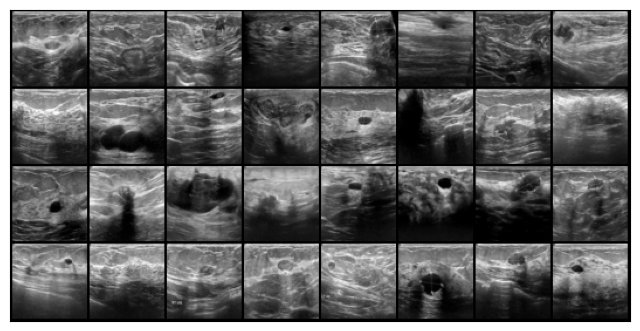

In [5]:
show_batch(dataloader)

In [6]:
for batch in dataloader:
    inputs = batch
    
    # Print the shapes
    print("Input shape:", inputs.shape)
    break

Input shape: torch.Size([32, 3, 64, 64])


In [7]:

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # in: 3 x 64 x 64
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 64 x 32 x 32

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 128 x 16 x 16

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 256 x 8 x 8

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 512 x 4 x 4

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            # out: 1 x 1 x 1

            nn.Flatten(),
            nn.Sigmoid())

    def forward(self, x):
        return self.model(x)


class Generator(nn.Module):
    def __init__(self, latent_size):
        super(Generator, self).__init__()

        self.model =  nn.Sequential(
            # in: latent_size x 1 x 1

            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # out: 512 x 4 x 4

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # out: 256 x 8 x 8

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # out: 128 x 16 x 16

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # out: 64 x 32 x 32

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # out: 3 x 64 x 64
        )

    def forward(self, x):
        return self.model(x)


latent_size = 128  
generator = Generator(latent_size)
discriminator = Discriminator()


torch.Size([32, 3, 64, 64])


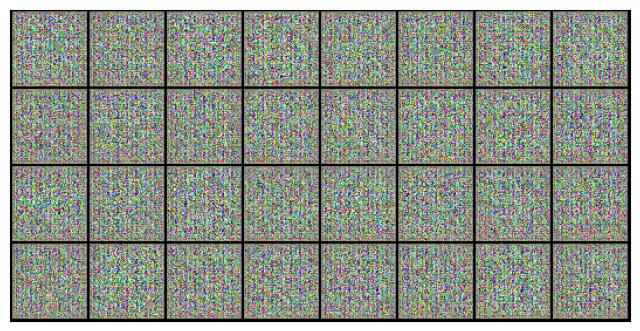

In [8]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [9]:
generator = generator.to(device)
discriminator = discriminator.to(device)

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [1/150], loss_g: 7.7978, loss_d: 0.0726, real_score: 0.9451, fake_score: 0.0005
Saving generated-images-0001.png


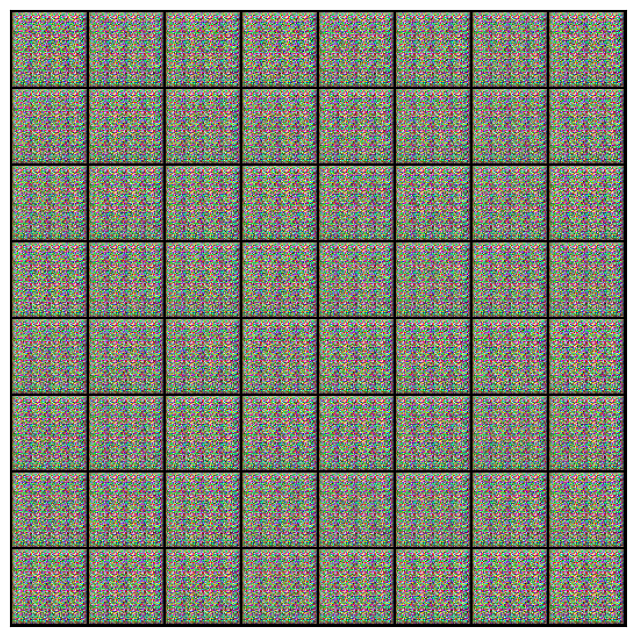

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [2/150], loss_g: 13.7231, loss_d: 0.0121, real_score: 0.9882, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [3/150], loss_g: 15.2618, loss_d: 0.0071, real_score: 0.9930, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [4/150], loss_g: 7.9949, loss_d: 0.0493, real_score: 0.9533, fake_score: 0.0002


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [5/150], loss_g: 6.5236, loss_d: 0.0528, real_score: 0.9605, fake_score: 0.0111


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [6/150], loss_g: 7.0744, loss_d: 0.0099, real_score: 0.9981, fake_score: 0.0079


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [7/150], loss_g: 3.8214, loss_d: 0.2225, real_score: 0.9288, fake_score: 0.1284


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [8/150], loss_g: 0.4218, loss_d: 0.8738, real_score: 0.5766, fake_score: 0.2444


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [9/150], loss_g: 2.0526, loss_d: 0.8491, real_score: 0.5245, fake_score: 0.0895


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [10/150], loss_g: 1.5459, loss_d: 1.3625, real_score: 0.3114, fake_score: 0.0455


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [11/150], loss_g: 1.8281, loss_d: 0.7078, real_score: 0.6484, fake_score: 0.1787
Saving generated-images-0011.png


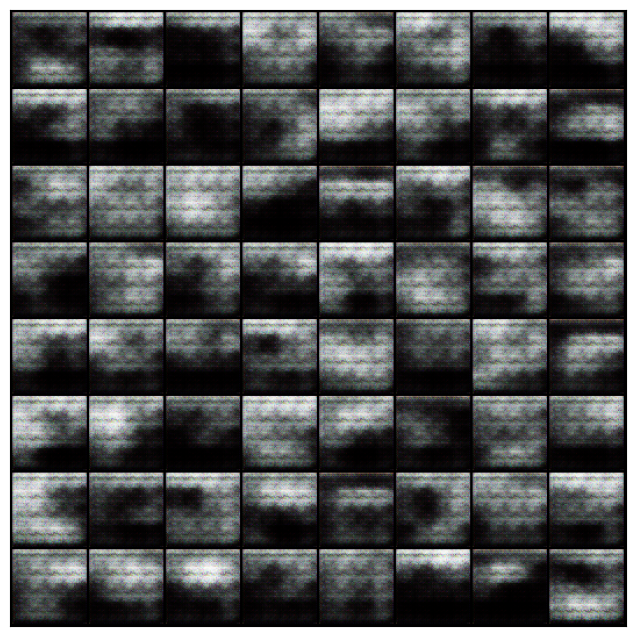

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [12/150], loss_g: 5.8284, loss_d: 0.5899, real_score: 0.9784, fake_score: 0.4028


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [13/150], loss_g: 2.5127, loss_d: 0.5540, real_score: 0.8929, fake_score: 0.3155


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [14/150], loss_g: 6.1837, loss_d: 0.7988, real_score: 0.9939, fake_score: 0.4877


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [15/150], loss_g: 1.9381, loss_d: 0.3974, real_score: 0.7473, fake_score: 0.0658


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [16/150], loss_g: 1.9511, loss_d: 3.0154, real_score: 0.0979, fake_score: 0.0074


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [17/150], loss_g: 4.1804, loss_d: 0.6007, real_score: 0.8996, fake_score: 0.3691


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [18/150], loss_g: 2.6899, loss_d: 0.4649, real_score: 0.8892, fake_score: 0.2632


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [19/150], loss_g: 3.8781, loss_d: 0.6624, real_score: 0.8846, fake_score: 0.3970


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [20/150], loss_g: 7.1505, loss_d: 0.8357, real_score: 0.9679, fake_score: 0.5212


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [21/150], loss_g: 3.4226, loss_d: 0.3541, real_score: 0.7531, fake_score: 0.0120
Saving generated-images-0021.png


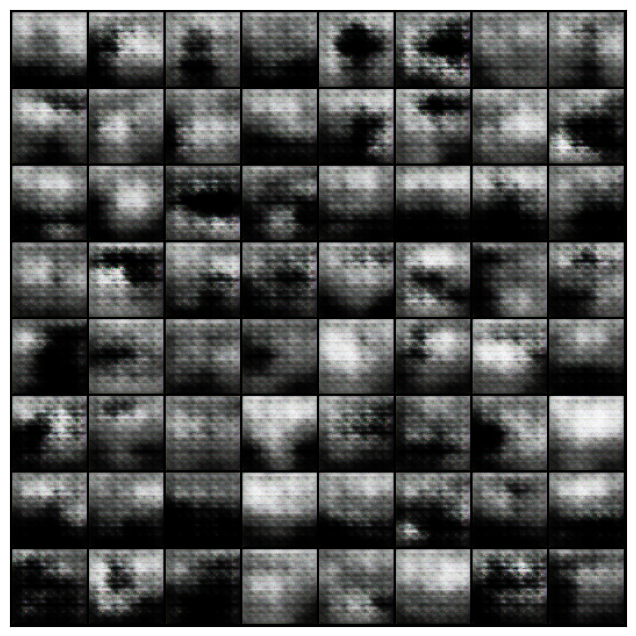

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [22/150], loss_g: 4.4463, loss_d: 1.3828, real_score: 0.3429, fake_score: 0.0045


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [23/150], loss_g: 3.0682, loss_d: 0.0716, real_score: 0.9739, fake_score: 0.0432


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [24/150], loss_g: 3.9354, loss_d: 0.3512, real_score: 0.9420, fake_score: 0.2437


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [25/150], loss_g: 4.9448, loss_d: 0.0330, real_score: 0.9744, fake_score: 0.0061


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [26/150], loss_g: 4.0871, loss_d: 0.1748, real_score: 0.9403, fake_score: 0.1040


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [27/150], loss_g: 3.4872, loss_d: 0.1862, real_score: 0.9076, fake_score: 0.0813


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [28/150], loss_g: 4.4108, loss_d: 1.9015, real_score: 0.1965, fake_score: 0.0039


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [29/150], loss_g: 3.6039, loss_d: 0.1543, real_score: 0.8934, fake_score: 0.0361


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [30/150], loss_g: 3.5801, loss_d: 0.2076, real_score: 0.9583, fake_score: 0.1494


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [31/150], loss_g: 5.9873, loss_d: 0.9138, real_score: 0.9884, fake_score: 0.4260
Saving generated-images-0031.png


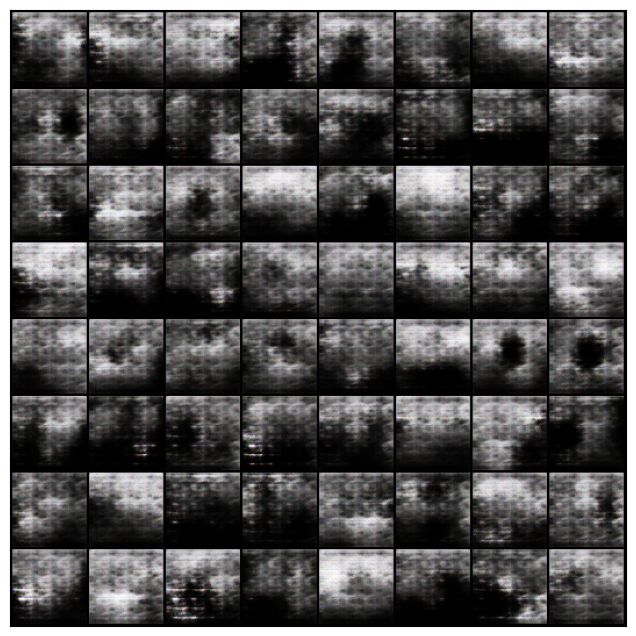

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [32/150], loss_g: 4.1846, loss_d: 0.3544, real_score: 0.8575, fake_score: 0.1605


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [33/150], loss_g: 8.8791, loss_d: 5.7806, real_score: 0.0067, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [34/150], loss_g: 3.7403, loss_d: 0.1338, real_score: 0.9666, fake_score: 0.0915


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [35/150], loss_g: 8.1591, loss_d: 2.0312, real_score: 0.9801, fake_score: 0.8147


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [36/150], loss_g: 5.4248, loss_d: 0.3970, real_score: 0.9573, fake_score: 0.2791


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [37/150], loss_g: 2.5064, loss_d: 0.2959, real_score: 0.8552, fake_score: 0.1247


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [38/150], loss_g: 4.4262, loss_d: 0.1467, real_score: 0.9586, fake_score: 0.0956


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [39/150], loss_g: 7.5142, loss_d: 1.0543, real_score: 0.9728, fake_score: 0.5344


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [40/150], loss_g: 5.1734, loss_d: 0.1300, real_score: 0.8998, fake_score: 0.0209


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [41/150], loss_g: 4.5335, loss_d: 0.3708, real_score: 0.8762, fake_score: 0.1843
Saving generated-images-0041.png


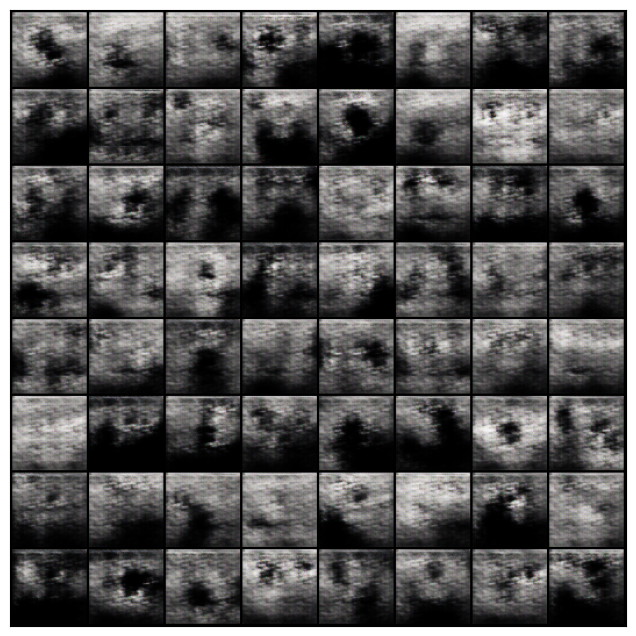

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [42/150], loss_g: 3.7867, loss_d: 0.2416, real_score: 0.8763, fake_score: 0.0936


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [43/150], loss_g: 3.5203, loss_d: 0.1805, real_score: 0.9655, fake_score: 0.1314


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [44/150], loss_g: 5.1355, loss_d: 0.1587, real_score: 0.9001, fake_score: 0.0455


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [45/150], loss_g: 2.8481, loss_d: 0.3793, real_score: 0.7329, fake_score: 0.0380


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [46/150], loss_g: 4.5994, loss_d: 2.0162, real_score: 0.1966, fake_score: 0.0027


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [47/150], loss_g: 4.0487, loss_d: 0.2353, real_score: 0.9718, fake_score: 0.1761


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [48/150], loss_g: 7.7679, loss_d: 3.3968, real_score: 0.0399, fake_score: 0.0002


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [49/150], loss_g: 4.0872, loss_d: 0.1432, real_score: 0.9901, fake_score: 0.1191


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [50/150], loss_g: 2.1856, loss_d: 0.2113, real_score: 0.8743, fake_score: 0.0683


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [51/150], loss_g: 4.5607, loss_d: 0.1418, real_score: 0.9775, fake_score: 0.1099
Saving generated-images-0051.png


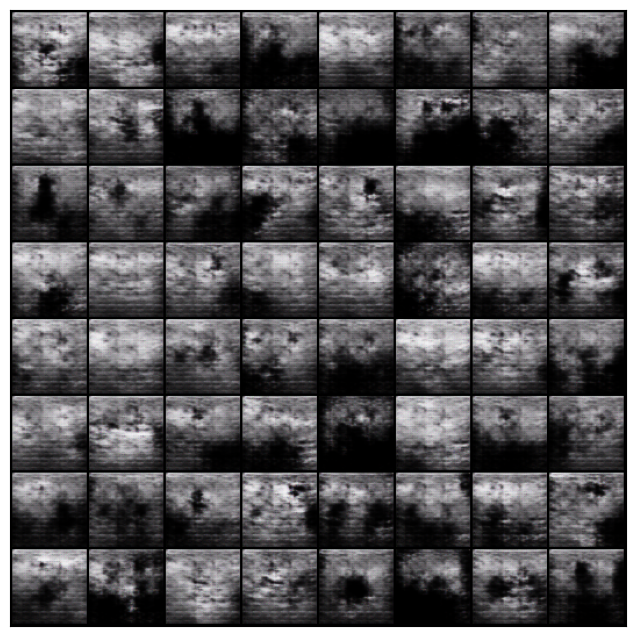

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [52/150], loss_g: 9.8081, loss_d: 5.0615, real_score: 0.0104, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [53/150], loss_g: 7.9180, loss_d: 1.0115, real_score: 0.9780, fake_score: 0.5686


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [54/150], loss_g: 3.3636, loss_d: 0.2608, real_score: 0.8213, fake_score: 0.0365


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [55/150], loss_g: 4.6882, loss_d: 0.8183, real_score: 0.9566, fake_score: 0.4641


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [56/150], loss_g: 9.8257, loss_d: 1.9988, real_score: 0.9880, fake_score: 0.7906


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [57/150], loss_g: 7.7296, loss_d: 1.5848, real_score: 0.9782, fake_score: 0.7501


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [58/150], loss_g: 2.4987, loss_d: 0.2751, real_score: 0.9853, fake_score: 0.2039


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [59/150], loss_g: 4.0807, loss_d: 0.0735, real_score: 0.9835, fake_score: 0.0511


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [60/150], loss_g: 4.4735, loss_d: 0.3184, real_score: 0.8108, fake_score: 0.0836


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [61/150], loss_g: 3.9887, loss_d: 0.0640, real_score: 0.9752, fake_score: 0.0373
Saving generated-images-0061.png


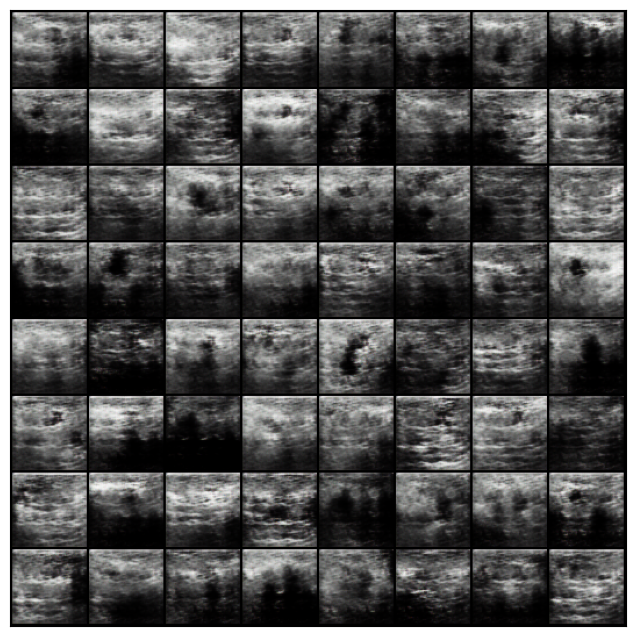

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [62/150], loss_g: 4.0255, loss_d: 0.1357, real_score: 0.9114, fake_score: 0.0383


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [63/150], loss_g: 5.1583, loss_d: 0.0305, real_score: 0.9761, fake_score: 0.0062


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [64/150], loss_g: 4.3219, loss_d: 0.0465, real_score: 0.9820, fake_score: 0.0275


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [65/150], loss_g: 7.6653, loss_d: 1.4407, real_score: 0.9882, fake_score: 0.7201


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [66/150], loss_g: 3.1860, loss_d: 0.1415, real_score: 0.9206, fake_score: 0.0531


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [67/150], loss_g: 4.0162, loss_d: 0.4686, real_score: 0.9091, fake_score: 0.2973


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [68/150], loss_g: 6.1918, loss_d: 0.2551, real_score: 0.8072, fake_score: 0.0049


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [69/150], loss_g: 5.6890, loss_d: 0.0094, real_score: 0.9958, fake_score: 0.0052


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [70/150], loss_g: 4.1711, loss_d: 0.0896, real_score: 0.9611, fake_score: 0.0467


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [71/150], loss_g: 5.3817, loss_d: 0.1402, real_score: 0.9250, fake_score: 0.0581
Saving generated-images-0071.png


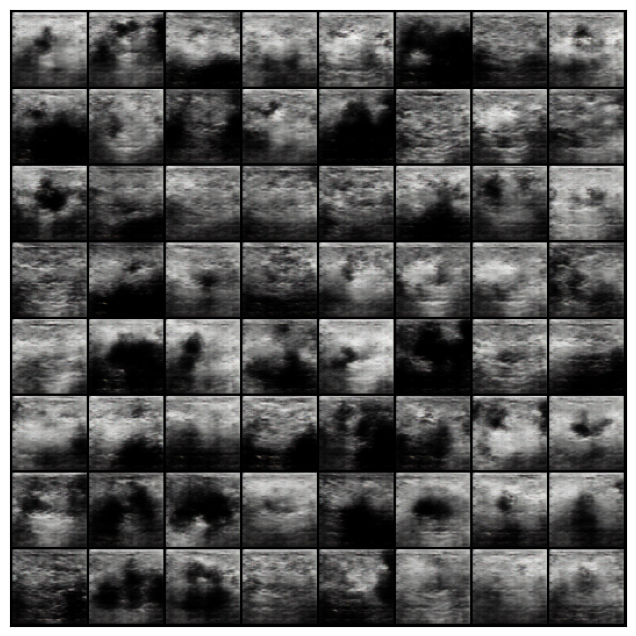

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [72/150], loss_g: 2.7566, loss_d: 0.2662, real_score: 0.8725, fake_score: 0.1079


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [73/150], loss_g: 3.5327, loss_d: 0.1495, real_score: 0.9517, fake_score: 0.0913


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [74/150], loss_g: 3.9542, loss_d: 0.1732, real_score: 0.9641, fake_score: 0.1203


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [75/150], loss_g: 5.1497, loss_d: 0.2755, real_score: 0.9843, fake_score: 0.2182


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [76/150], loss_g: 4.0387, loss_d: 0.0948, real_score: 0.9986, fake_score: 0.0876


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [77/150], loss_g: 5.9458, loss_d: 0.3800, real_score: 0.9819, fake_score: 0.2830


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [78/150], loss_g: 3.5824, loss_d: 0.6550, real_score: 0.9007, fake_score: 0.3922


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [79/150], loss_g: 2.8268, loss_d: 0.3593, real_score: 0.7790, fake_score: 0.0864


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [80/150], loss_g: 3.6970, loss_d: 0.3652, real_score: 0.8341, fake_score: 0.1505


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [81/150], loss_g: 4.2960, loss_d: 0.0955, real_score: 0.9220, fake_score: 0.0110
Saving generated-images-0081.png


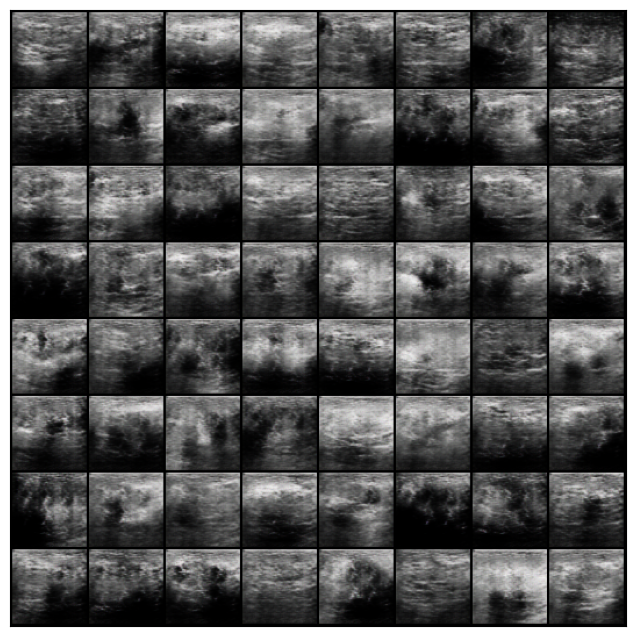

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [82/150], loss_g: 6.2347, loss_d: 0.0335, real_score: 0.9711, fake_score: 0.0040


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [83/150], loss_g: 3.6847, loss_d: 0.1264, real_score: 0.9575, fake_score: 0.0762


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [84/150], loss_g: 3.6967, loss_d: 0.1463, real_score: 0.9465, fake_score: 0.0832


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [85/150], loss_g: 3.6690, loss_d: 0.0661, real_score: 0.9965, fake_score: 0.0537


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [86/150], loss_g: 4.1067, loss_d: 0.3017, real_score: 0.7898, fake_score: 0.0097


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [87/150], loss_g: 6.0599, loss_d: 0.7190, real_score: 0.9827, fake_score: 0.4796


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [88/150], loss_g: 5.7422, loss_d: 0.2438, real_score: 0.9865, fake_score: 0.2018


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [89/150], loss_g: 4.1000, loss_d: 1.3139, real_score: 0.3122, fake_score: 0.0007


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [90/150], loss_g: 4.3179, loss_d: 0.1109, real_score: 0.9172, fake_score: 0.0228


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [91/150], loss_g: 4.6593, loss_d: 0.0995, real_score: 0.9365, fake_score: 0.0300
Saving generated-images-0091.png


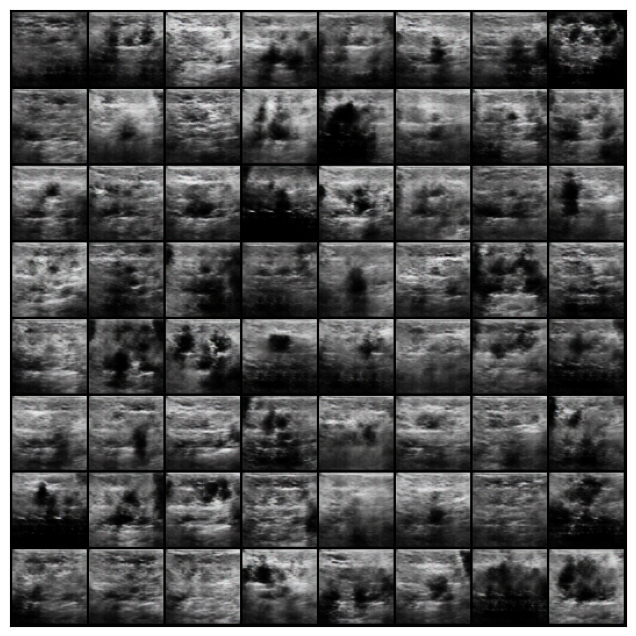

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [92/150], loss_g: 3.5779, loss_d: 0.2950, real_score: 0.9486, fake_score: 0.2066


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [93/150], loss_g: 7.2156, loss_d: 0.0087, real_score: 0.9921, fake_score: 0.0008


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [94/150], loss_g: 7.1213, loss_d: 0.1174, real_score: 0.8990, fake_score: 0.0017


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [95/150], loss_g: 3.4907, loss_d: 0.2755, real_score: 0.8659, fake_score: 0.1146


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [96/150], loss_g: 3.3861, loss_d: 0.2162, real_score: 0.8579, fake_score: 0.0494


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [97/150], loss_g: 3.7231, loss_d: 0.2729, real_score: 0.8373, fake_score: 0.0768


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [98/150], loss_g: 3.9741, loss_d: 0.1887, real_score: 0.8724, fake_score: 0.0337


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [99/150], loss_g: 3.3545, loss_d: 0.0835, real_score: 0.9558, fake_score: 0.0364


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [100/150], loss_g: 3.3414, loss_d: 0.1901, real_score: 0.9727, fake_score: 0.1404


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [101/150], loss_g: 4.2690, loss_d: 0.2187, real_score: 0.9889, fake_score: 0.1744
Saving generated-images-0101.png


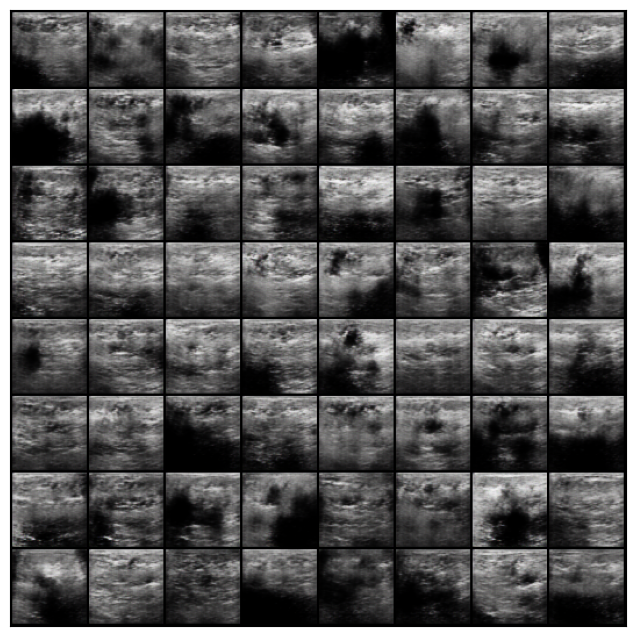

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [102/150], loss_g: 7.0926, loss_d: 0.1002, real_score: 0.9133, fake_score: 0.0068


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [103/150], loss_g: 7.0673, loss_d: 0.0709, real_score: 0.9405, fake_score: 0.0071


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [104/150], loss_g: 4.3402, loss_d: 0.1975, real_score: 0.9297, fake_score: 0.0967


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [105/150], loss_g: 4.0160, loss_d: 0.3051, real_score: 0.9937, fake_score: 0.2144


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [106/150], loss_g: 5.4854, loss_d: 0.2361, real_score: 0.9566, fake_score: 0.1654


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [107/150], loss_g: 4.4352, loss_d: 0.1274, real_score: 0.9636, fake_score: 0.0836


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [108/150], loss_g: 4.8158, loss_d: 0.2201, real_score: 0.9979, fake_score: 0.1833


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [109/150], loss_g: 5.6927, loss_d: 0.1397, real_score: 0.9851, fake_score: 0.1158


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [110/150], loss_g: 5.0622, loss_d: 0.4894, real_score: 0.9960, fake_score: 0.2600


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [111/150], loss_g: 5.0050, loss_d: 0.0940, real_score: 0.9474, fake_score: 0.0373
Saving generated-images-0111.png


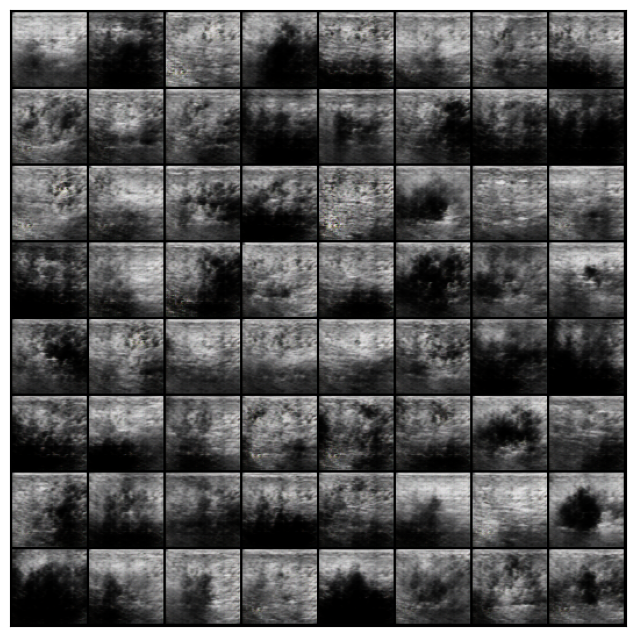

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [112/150], loss_g: 4.9645, loss_d: 0.0353, real_score: 0.9996, fake_score: 0.0324


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [113/150], loss_g: 5.0513, loss_d: 0.4546, real_score: 0.7300, fake_score: 0.0155


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [114/150], loss_g: 6.4785, loss_d: 0.3725, real_score: 0.7407, fake_score: 0.0032


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [115/150], loss_g: 3.7550, loss_d: 0.0988, real_score: 0.9135, fake_score: 0.0062


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [116/150], loss_g: 4.3703, loss_d: 0.2030, real_score: 0.9161, fake_score: 0.0915


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [117/150], loss_g: 7.4501, loss_d: 0.0152, real_score: 0.9856, fake_score: 0.0006


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [118/150], loss_g: 3.9896, loss_d: 0.1593, real_score: 0.8965, fake_score: 0.0449


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [119/150], loss_g: 8.0718, loss_d: 0.2628, real_score: 0.7786, fake_score: 0.0003


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [120/150], loss_g: 4.0102, loss_d: 0.0511, real_score: 0.9560, fake_score: 0.0049


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [121/150], loss_g: 5.8282, loss_d: 0.3187, real_score: 0.9504, fake_score: 0.1872
Saving generated-images-0121.png


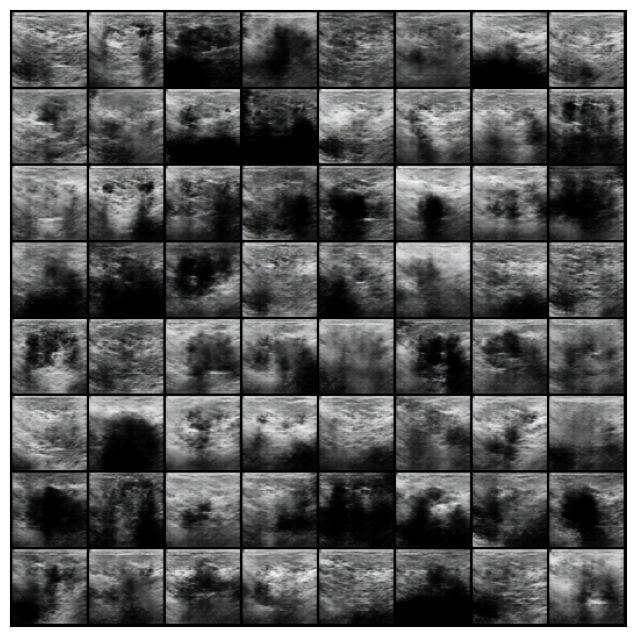

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [122/150], loss_g: 5.0429, loss_d: 1.2389, real_score: 0.3366, fake_score: 0.0017


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [123/150], loss_g: 2.7299, loss_d: 0.1290, real_score: 0.9880, fake_score: 0.1071


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [124/150], loss_g: 4.9776, loss_d: 0.0162, real_score: 0.9886, fake_score: 0.0047


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [125/150], loss_g: 3.1228, loss_d: 0.0504, real_score: 0.9625, fake_score: 0.0116


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [126/150], loss_g: 3.4753, loss_d: 0.1288, real_score: 0.9445, fake_score: 0.0640


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [127/150], loss_g: 5.9355, loss_d: 0.0112, real_score: 0.9917, fake_score: 0.0027


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [128/150], loss_g: 3.2478, loss_d: 0.5300, real_score: 0.7304, fake_score: 0.1035


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [129/150], loss_g: 5.2564, loss_d: 0.0419, real_score: 0.9737, fake_score: 0.0146


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [130/150], loss_g: 3.2663, loss_d: 0.1698, real_score: 0.8848, fake_score: 0.0360


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [131/150], loss_g: 5.7833, loss_d: 0.2546, real_score: 0.9737, fake_score: 0.1871
Saving generated-images-0131.png


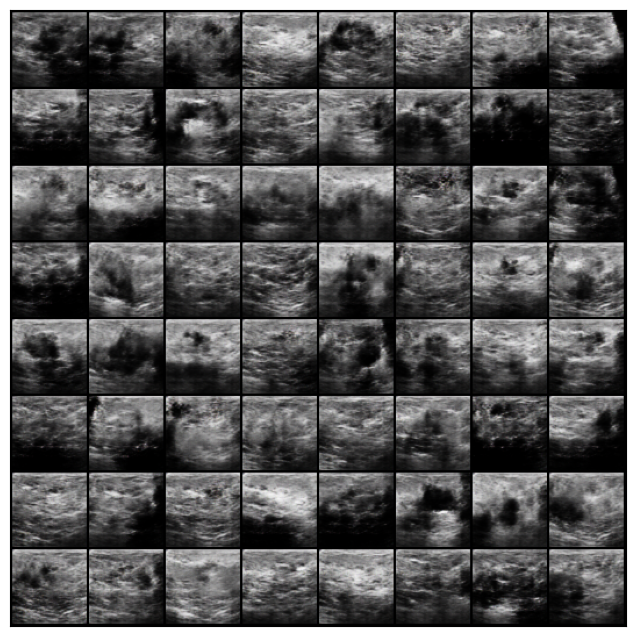

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [132/150], loss_g: 8.8103, loss_d: 0.0650, real_score: 0.9429, fake_score: 0.0014


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [133/150], loss_g: 5.9573, loss_d: 0.0139, real_score: 0.9952, fake_score: 0.0090


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [134/150], loss_g: 5.4021, loss_d: 0.4285, real_score: 0.9034, fake_score: 0.1993


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [135/150], loss_g: 9.9672, loss_d: 0.6151, real_score: 0.9957, fake_score: 0.4300


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [136/150], loss_g: 6.9516, loss_d: 0.6013, real_score: 0.9831, fake_score: 0.3754


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [137/150], loss_g: 4.1030, loss_d: 0.0875, real_score: 0.9345, fake_score: 0.0181


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [138/150], loss_g: 4.6053, loss_d: 0.0810, real_score: 0.9493, fake_score: 0.0273


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [139/150], loss_g: 5.7761, loss_d: 0.1012, real_score: 0.9153, fake_score: 0.0065


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [140/150], loss_g: 11.9283, loss_d: 0.7003, real_score: 0.9866, fake_score: 0.4736


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [141/150], loss_g: 3.7370, loss_d: 0.1741, real_score: 0.9984, fake_score: 0.1416
Saving generated-images-0141.png


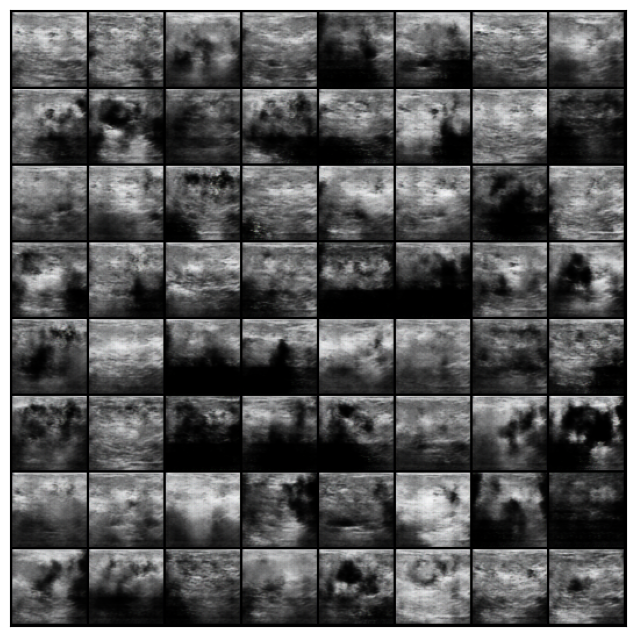

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [142/150], loss_g: 3.9263, loss_d: 0.0554, real_score: 0.9913, fake_score: 0.0448


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [143/150], loss_g: 5.2385, loss_d: 0.0127, real_score: 0.9908, fake_score: 0.0034


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [144/150], loss_g: 5.1306, loss_d: 0.0151, real_score: 0.9891, fake_score: 0.0041


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [145/150], loss_g: 10.8496, loss_d: 0.8236, real_score: 0.4908, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [146/150], loss_g: 4.0032, loss_d: 0.0638, real_score: 0.9851, fake_score: 0.0446


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [147/150], loss_g: 5.2959, loss_d: 0.0094, real_score: 0.9960, fake_score: 0.0054


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [148/150], loss_g: 5.7478, loss_d: 0.0711, real_score: 0.9491, fake_score: 0.0169


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [149/150], loss_g: 2.2598, loss_d: 0.0650, real_score: 0.9869, fake_score: 0.0499


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [150/150], loss_g: 5.7704, loss_d: 0.0710, real_score: 0.9378, fake_score: 0.0052


In [10]:
class GANTrainer:
    def __init__(self, generator, discriminator, latent_size, train_dl, batch_size, normal, device='cuda'):
        self.generator = generator
        self.discriminator = discriminator
        self.train_dl = train_dl
        self.device = device
        self.latent_size = latent_size
        self.fixed_latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    
    def denorm(self, img_tensors):
        return img_tensors * normal[1][0] + normal[0][0]

    def save_samples(self, index):
        latent_tensors = torch.randn(64, self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent_tensors)
        fake_fname = f'generated-images-{index:04d}.png'
        save_image(fake_images, os.path.join('/kaggle/working/', fake_fname), nrow=8)
        print('Saving', fake_fname)
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(self.denorm(fake_images.cpu().detach()), nrow=8).permute(1, 2, 0))
        plt.show()

    def train_discriminator(self, real_images, opt_d):
        opt_d.zero_grad()

        real_preds = self.discriminator(real_images)
        real_targets = torch.ones(real_images.size(0), 1, device=self.device)
        real_loss = F.binary_cross_entropy(real_preds, real_targets)
        real_score = torch.mean(real_preds).item()

        latent = torch.randn(real_images.size(0), self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent)

        fake_targets = torch.zeros(real_images.size(0), 1, device=self.device)
        fake_preds = self.discriminator(fake_images.detach())
        fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
        fake_score = torch.mean(fake_preds).item()

        loss = real_loss + fake_loss
        loss.backward()
        opt_d.step()

        return loss.item(), real_score, fake_score

    def train_generator(self, opt_g):
        opt_g.zero_grad()

        latent = torch.randn(self.train_dl.batch_size, self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent)

        preds = self.discriminator(fake_images)
        targets = torch.ones(self.train_dl.batch_size, 1, device=self.device)
        loss = F.binary_cross_entropy(preds, targets)

        loss.backward()
        opt_g.step()

        return loss.item()

    def fit(self, epochs, lr, start_idx=1):
        torch.cuda.empty_cache()

        losses_g = []
        losses_d = []
        real_scores = []
        fake_scores = []

        opt_d = optim.Adam(self.discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
        opt_g = optim.Adam(self.generator.parameters(), lr=lr, betas=(0.5, 0.999))

        for epoch in range(epochs):
            for real_images in tqdm(self.train_dl):
                loss_d, real_score, fake_score = self.train_discriminator(real_images.to(self.device), opt_d)
                loss_g = self.train_generator(opt_g)

            losses_g.append(loss_g)
            losses_d.append(loss_d)
            real_scores.append(real_score)
            fake_scores.append(fake_score)

            print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
                epoch + 1, epochs, loss_g, loss_d, real_score, fake_score))
            
            if epoch % 10 == 0:
                # Save generated images
                self.save_samples(epoch + start_idx)

        return losses_g, losses_d, real_scores, fake_scores

trainer = GANTrainer(generator, discriminator, latent_size, dataloader, batch_size, normal)
losses_g, losses_d, real_scores, fake_scores = trainer.fit(epochs=150, lr=0.0002)


In [11]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [12]:

def plot_losses_and_scores(losses_d, losses_g, real_scores, fake_scores):
    # Plot losses
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(losses_d, '-')
    plt.plot(losses_g, '-')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Discriminator', 'Generator'])
    plt.title('Losses')

    # Plot scores
    plt.subplot(1, 2, 2)
    plt.plot(real_scores, '-')
    plt.plot(fake_scores, '-')
    plt.xlabel('epoch')
    plt.ylabel('score')
    plt.legend(['Real', 'Fake'])
    plt.title('Scores')

    plt.tight_layout()
    plt.show()

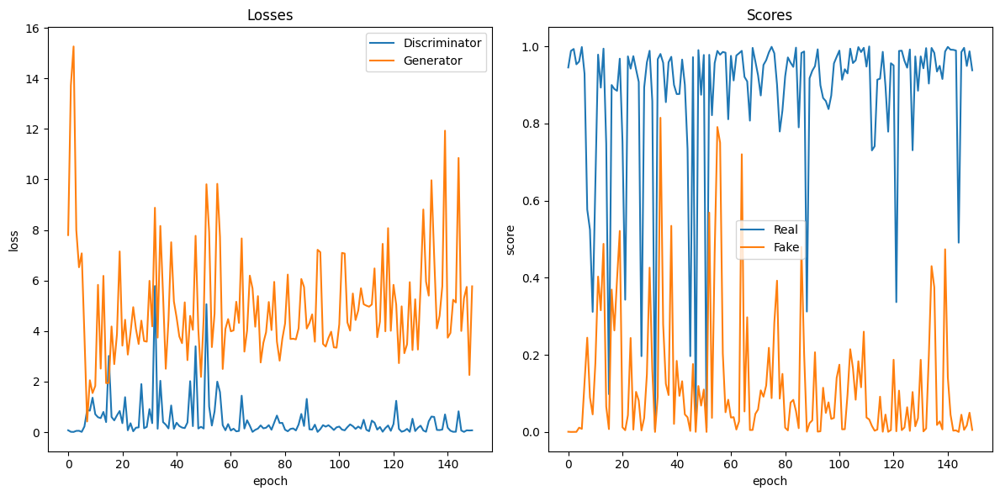

In [13]:
plot_losses_and_scores(losses_d, losses_g, real_scores, fake_scores)
